## TTS Tutorial

**Prepared by:** Ye Kyaw Thu, Language Understanding Lab., Myanmar  
**Last Updated Date:** 20 June 2026  
*For AI Engineering (Fundamental) class students*  

## Reference

- SLR80 Dataset: [https://www.openslr.org/80/](https://www.openslr.org/80/)  

```
@inproceedings{oo-etal-2020-burmese,
    title = {{Burmese Speech Corpus, Finite-State Text Normalization and Pronunciation Grammars with an Application to Text-to-Speech}},
    author = {Oo, Yin May and Wattanavekin, Theeraphol and Li, Chenfang and De Silva, Pasindu and Sarin, Supheakmungkol and Pipatsrisawat, Knot and Jansche, Martin and Kjartansson, Oddur and Gutkin, Alexander},
    booktitle = {Proceedings of The 12th Language Resources and Evaluation Conference (LREC)},
    month = may,
    year = {2020},
    pages = "6328--6339",
    address = {Marseille, France},
    publisher = {European Language Resources Association (ELRA)},
    url = {https://www.aclweb.org/anthology/2020.lrec-1.777},
    ISBN = {979-10-95546-34-4},
  }
```


## Current Version

In [46]:
from IPython.display import Code

# Pass the path to your python file
Code(filename="myanmar_tts_transformer.py", language="python")

#!/usr/bin/env python3
# -*- coding: utf-8 -*-
"""
Myanmar TTS Demo v5  —  TransformerTTS + Guided Attention  (No MFA)
=====================================================================
Filename: myanmar_tts_demo.py

═══════════════════════════════════════════════════════════════
  WHY v1-v3 ALWAYS PRODUCED WIND  (structural root cause)
═══════════════════════════════════════════════════════════════

All v1-v3 versions used a non-autoregressive architecture:
  Text → Encoder → Gaussian Upsampling → Decoder → Mel

The Gaussian upsampling gives each mel frame a SOFT MIXTURE of
character embeddings.  The same mixture can correspond to many
different phonemes.  Under L1 loss the model predicts the
CONDITIONAL MEAN of all possible targets.

  Mean of [vowel 'a' spectrum, consonant 'k' spectrum, ...]
  = flat, featureless average = white noise = wind sound.

Evidence: v3.1 dev loss plateau at 1.06 from epoch 21 → 118
(97 more epochs, only 0.024 improvement).  That plateau IS the
model converging to the conditional-mean prediction, not a bug.

✅ FIX (v4): switched to an autoregressive decoder (TransformerTTS).
  The decoder receives the PREVIOUS MEL FRAME as an additional input,
  removing the averaging ambiguity entirely.

═══════════════════════════════════════════════════════════════
  WHY v4 PRODUCED ONLY ~11 FRAMES REGARDLESS OF TEXT LENGTH
═══════════════════════════════════════════════════════════════

v4 trained beautifully (dev 0.97→0.25 over 300 epochs, no plateau —
proof the decoder CAN model real mel spectra).  But at inference,
EVERY input — a 9-char word and a 62-char sentence alike — produced
exactly ~11 frames of near-silent output ("kyit").

Root cause: EXPOSURE BIAS + UNCONSTRAINED CROSS-ATTENTION.
  Training (teacher forcing): decoder input at step t = GT mel[t-1],
  always perfect.  Cross-attention never has to recover from a bad
  self-generated frame.
  Inference (autoregressive): decoder input at step t = its OWN
  prediction.  Small errors compound every step.  Within ~10 frames
  the input drifts out of the training distribution.  Vanilla
  multi-head attention — never forced to be monotonic, and never
  needed to be during teacher forcing — locks onto an arbitrary
  text position (often near the end token) and the decoder reads
  "end of utterance" context → stop fires immediately.
  Proof: output length was IDENTICAL regardless of input length,
  meaning the decoder wasn't actually reading the text encoder.

✅ FIX (v5) — Guided Attention Loss (DC-TTS, Tachibana et al. 2017):
  Adds a loss term that penalises attention mass falling far from
  the diagonal (mel_position/mel_len ≈ text_position/text_len).
  This gives an explicit gradient toward the only sensible alignment
  for speech — monotonic, left-to-right, one pass over the text —
  which is exactly the standard remedy for this failure mode on
  small TTS datasets (~2000 utterances, as here).

✅ FIX (v5) — Length-aware inference floor (safety net):
  min_frames/max_frames are computed from input text length ×
  mean frames/char (from dataset_stats.json), so the stop-token
  cannot terminate generation after only ~11 frames regardless of
  how long the input text is.

Architecture (unchanged from v4):
  Text → CharEmbed+SinPE → TransformerEncoder(N)
                                   ↓  cross-attention (now guided)
  [GT mel t-1] → PreNet → +SinPE → TransformerDecoder(N)
                                       ↓
                               Linear → mel_before
                               Postnet → mel_after
                               Linear → stop_logit
  Training:  teacher forcing + guided attention loss on every layer
  Inference: autoregressive loop with length-aware min/max frames

Expected behaviour after retraining with v5:
  - Output length scales with input text length (9 chars → ~60-70
    frames, 62 chars → ~400-450 frames), not a fixed ~11 frames.
  - mel_db max should reach -5 to -15 dB (not -47 to -48 dB).
  - Cross-attention maps

## Running Steps
  
# Data Preparation  
python myanmar_tts_transformer.py --stage prep --data_dir ./data/slr80 --output_dir ./tts_output

# Train from scratch — delete old best_model.pt first
rm -f ./tts_output/best_model.pt ./tts_output/checkpoint_*.pt

python myanmar_tts_transformer.py --stage train \
    --output_dir ./tts_output --epochs 300

# Vocoder sanity check (should still sound perfect)
python myanmar_tts_transformer.py --stage synth \
    --output_dir ./tts_output --gt_sample_id bur_5362_4875790905

# Full TTS — should now produce real Burmese speech, not wind
python myanmar_tts_transformer.py --stage synth \
    --output_dir ./tts_output \
    --synth_text "ကျွန်တော် ကလည်း ဒိတ်ဒိတ်ကျဲ အောင်မြင်နေတဲ့ မင်းသား မှ မဟုတ်တာလေ" \
    --gt_compare


In [24]:
%pwd

'/mnt/disk1/ye/exp/asr_tts_SLR80'

## Step1: Data Preparation

In [25]:
!time python myanmar_tts_transformer.py --stage prep \
    --data_dir ./data/slr80 --output_dir ./tts_output

2026-06-19 14:07:38  [INFO    ]  Found 2530 audio files.
2026-06-19 14:07:38  [INFO    ]  Vocabulary: 66 characters
2026-06-19 14:07:38  [INFO    ]  Computing mel spectrograms ...
2026-06-19 14:08:00  [INFO    ]    500/2530 ...
2026-06-19 14:08:23  [INFO    ]    1000/2530 ...
2026-06-19 14:08:45  [INFO    ]    1500/2530 ...
2026-06-19 14:08:57  [INFO    ]    2000/2530 ...
2026-06-19 14:09:01  [INFO    ]    2500/2530 ...
2026-06-19 14:09:01  [INFO    ]  Valid: 2530 | Skipped: 0
2026-06-19 14:09:01  [INFO    ]  Mel norm check: min=-1.000 max=1.000 mean=-0.481
2026-06-19 14:09:01  [INFO    ]  Mel frames : mean=504 ± 150
2026-06-19 14:09:01  [INFO    ]  Frames/char: mean=7.3 ± 1.6
2026-06-19 14:09:02  [INFO    ]    train: 2024
2026-06-19 14:09:02  [INFO    ]    dev: 253
2026-06-19 14:09:02  [INFO    ]    test: 253
2026-06-19 14:09:02  [INFO    ]  Data preparation complete ✓

real	1m24.787s
user	30m44.848s
sys	0m3.210s


## Step2: Training

In [26]:
!time python myanmar_tts_transformer.py --stage train \
    --output_dir ./tts_output --epochs 300

2026-06-19 14:14:06  [INFO    ]  Vocab:66  Train:2024  Dev:253
2026-06-19 14:14:06  [INFO    ]  Device: cuda
2026-06-19 14:14:06  [INFO    ]  TransformerTTS parameters: 45,399,617
2026-06-19 14:14:07  [INFO    ]  Training 300 epochs (warmup=20, lr=1.0e-03)
2026-06-19 14:14:07  [INFO    ]  Architecture: TransformerTTS + Guided Attention Loss (v5)
2026-06-19 14:14:07  [INFO    ]  Expected: ep1≈0.8-1.1  ep50≈0.35-0.55  ep200≈0.10-0.25
2026-06-19 14:14:07  [INFO    ]  v4 bug: stop fired ~11 frames regardless of text length (exposure
2026-06-19 14:14:07  [INFO    ]  bias + unconstrained attention).  Guided attention loss forces
2026-06-19 14:14:07  [INFO    ]  monotonic left-to-right alignment, fixing the early-stop collapse.
2026-06-19 14:14:26  [INFO    ]  Epoch    1/300 | train=1.7123  dev=1.0000 | lr=1.00e-04
2026-06-19 14:14:26  [INFO    ]    ✓ Best model saved (dev=1.0000)
2026-06-19 14:14:44  [INFO    ]  Epoch    2/300 | train=1.0673  dev=0.8140 | lr=1.50e-04
2026-06-19 14:14:47  [IN

In [36]:
!python ./myanmar_tts_transformer.py --help

usage: myanmar_tts_transformer.py [-h] [--stage {prep,train,synth,eval,all}]
                                  [--check_deps] [--data_dir DATA_DIR]
                                  [--tsv_file TSV_FILE]
                                  [--output_dir OUTPUT_DIR]
                                  [--train_ratio TRAIN_RATIO]
                                  [--dev_ratio DEV_RATIO]
                                  [--max_samples MAX_SAMPLES]
                                  [--sample_rate SAMPLE_RATE] [--n_fft N_FFT]
                                  [--hop_length HOP_LENGTH]
                                  [--win_length WIN_LENGTH] [--n_mels N_MELS]
                                  [--fmin FMIN] [--fmax FMAX]
                                  [--d_model D_MODEL] [--n_heads N_HEADS]
                                  [--n_layers N_LAYERS] [--ffn_dim FFN_DIM]
                                  [--dropout DROPOUT] [--epochs EPOCHS]
                                  [--warmup_epochs WAR

## List Samples

In [37]:
!python myanmar_tts_transformer.py --stage synth --output_dir ./tts_output --list_samples

/home/ye/.cache/torch/hub/NVIDIA_DeepLearningExamples_torchhub/PyTorch/Classification/ConvNets/image_classification/models/common.py:13: UserWarning: pytorch_quantization module not found, quantization will not be available
  warnings.warn(
/home/ye/.cache/torch/hub/NVIDIA_DeepLearningExamples_torchhub/PyTorch/Classification/ConvNets/image_classification/models/efficientnet.py:17: UserWarning: pytorch_quantization module not found, quantization will not be available
  warnings.warn(
2026-06-20 13:54:18  [WARNING ]  WaveGlow unavailable (RuntimeError), using Griffin-Lim.
2026-06-20 13:54:18  [INFO    ]  Sample IDs (first 20):
2026-06-20 13:54:18  [INFO    ]    bur_8266_7413365509               ဥပမာ မိုးဟေကို ဆိုရင် ဆောင်းဟေကို နာမည် ကို ဆင်တူ 
2026-06-20 13:54:18  [INFO    ]    bur_7865_2573585785               ဒါပေမဲ့ ဒီ ကျောက် က ရာသက်ပန် မကုန်အောင် ထွက်နေမှာ 
2026-06-20 13:54:18  [INFO    ]    bur_5189_3215659791               ကိုကျော်သူ မမေသန်းနု ဒေါ်အေးအေးသင်းတို့ ပါတယ်
2026-06-20 1

## Vocoder Check

In [38]:
!time python myanmar_tts_transformer.py --stage synth \
--output_dir ./tts_output --gt_sample_id bur_5362_4875790905

/home/ye/.cache/torch/hub/NVIDIA_DeepLearningExamples_torchhub/PyTorch/Classification/ConvNets/image_classification/models/common.py:13: UserWarning: pytorch_quantization module not found, quantization will not be available
  warnings.warn(
/home/ye/.cache/torch/hub/NVIDIA_DeepLearningExamples_torchhub/PyTorch/Classification/ConvNets/image_classification/models/efficientnet.py:17: UserWarning: pytorch_quantization module not found, quantization will not be available
  warnings.warn(
2026-06-20 13:56:56  [WARNING ]  WaveGlow unavailable (RuntimeError), using Griffin-Lim.
2026-06-20 13:56:56  [INFO    ]  Found bur_5362_4875790905 in train
2026-06-20 13:56:56  [INFO    ]  GT text: ကျွန်တော် ကလည်း ဒိတ်ဒိတ်ကျဲ အောင်မြင်နေတဲ့ မင်းသား မှ မဟုတ်တာလေ
2026-06-20 13:56:56  [INFO    ]  GT mel: min=-80.0 max=0.0 mean=-57.5 dB  shape=(522, 80)
/mnt/disk1/ye/exp/asr_tts_SLR80/myanmar_tts_transformer.py:809: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from font(s) Myanmar3.
  plt.tight_layout(); p

In [39]:
import IPython.display as ipd

# For a local file
ipd.Audio("./gt_bur_5362_4875790905.wav")

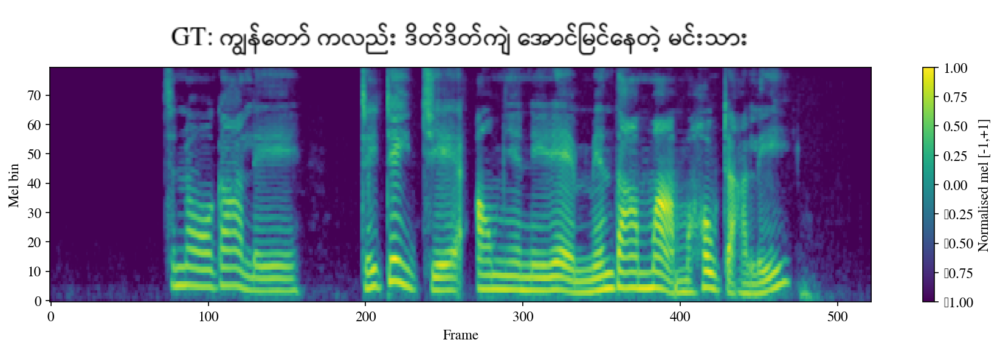

In [31]:
from IPython.display import Image
Image(filename='gt_bur_5362_4875790905.png')

## Full TTS

In [40]:
!time python myanmar_tts_transformer.py --stage synth \
--output_dir ./tts_output \
--synth_text "ကျွန်တော် ကလည်း ဒိတ်ဒိတ်ကျဲ အောင်မြင်နေတဲ့ မင်းသား မှ မဟုတ်တာလေ" \
--gt_compare

/home/ye/.cache/torch/hub/NVIDIA_DeepLearningExamples_torchhub/PyTorch/Classification/ConvNets/image_classification/models/common.py:13: UserWarning: pytorch_quantization module not found, quantization will not be available
  warnings.warn(
/home/ye/.cache/torch/hub/NVIDIA_DeepLearningExamples_torchhub/PyTorch/Classification/ConvNets/image_classification/models/efficientnet.py:17: UserWarning: pytorch_quantization module not found, quantization will not be available
  warnings.warn(
2026-06-20 13:59:10  [WARNING ]  WaveGlow unavailable (RuntimeError), using Griffin-Lim.
2026-06-20 13:59:11  [INFO    ]  Loaded TransformerTTS: epoch=299 dev=0.2408
2026-06-20 13:59:11  [INFO    ]  Synthesizing: 'ကျွန်တော် ကလည်း ဒိတ်ဒိတ်ကျဲ အောင်မြင်နေတဲ့ မင်းသား မှ မဟုတ်တာလေ'
2026-06-20 13:59:11  [INFO    ]    length   : 65 tokens × 7.3 fpc ≈ 472 frames  (floor=236, cap=1200)
2026-06-20 13:59:12  [INFO    ]    mel_norm : min=-1.035  max=-0.460  mean=-0.998
2026-06-20 13:59:12  [INFO    ]    mel_db   : min

In [41]:
import IPython.display as ipd

# For a local file
ipd.Audio("./tts_output/synthesized.wav")

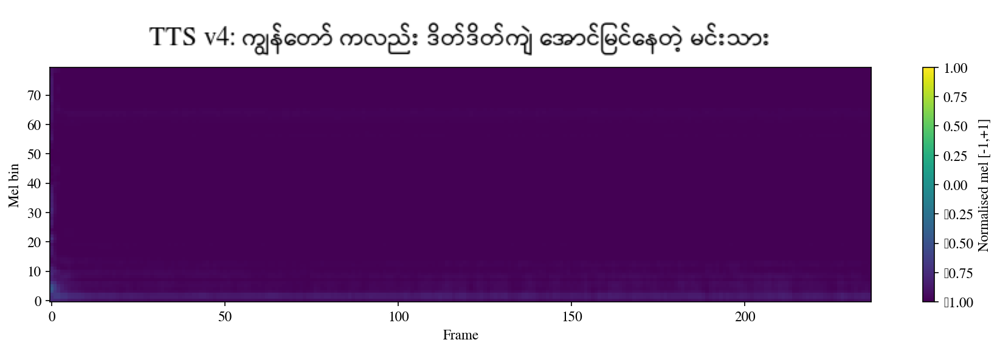

In [42]:
from IPython.display import Image
Image(filename='./tts_output/synthesized.png')

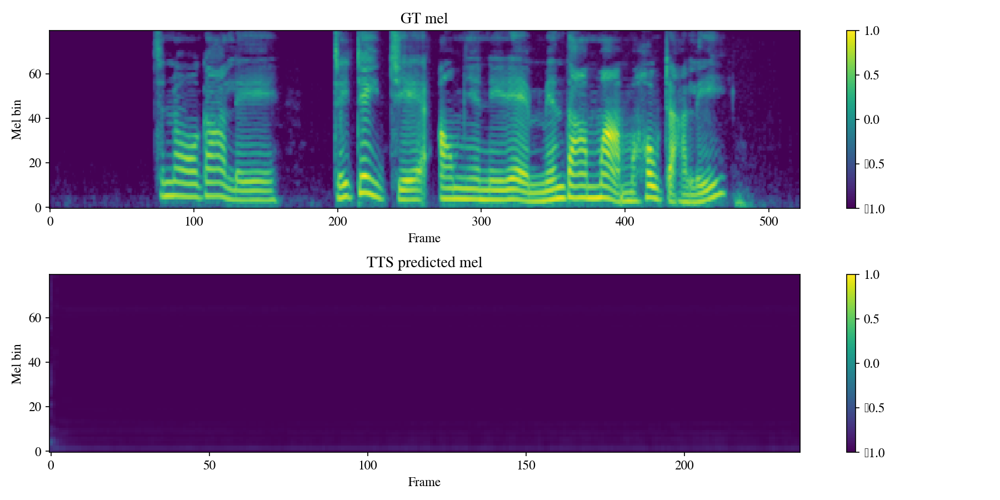

In [43]:
from IPython.display import Image
Image(filename='synthesized_compare.png')

In [44]:
!time python myanmar_tts_transformer.py --stage synth \
    --output_dir ./tts_output --synth_text "မင်္ဂလာပါ" --gt_compare

/home/ye/.cache/torch/hub/NVIDIA_DeepLearningExamples_torchhub/PyTorch/Classification/ConvNets/image_classification/models/common.py:13: UserWarning: pytorch_quantization module not found, quantization will not be available
  warnings.warn(
/home/ye/.cache/torch/hub/NVIDIA_DeepLearningExamples_torchhub/PyTorch/Classification/ConvNets/image_classification/models/efficientnet.py:17: UserWarning: pytorch_quantization module not found, quantization will not be available
  warnings.warn(
2026-06-20 14:01:49  [WARNING ]  WaveGlow unavailable (RuntimeError), using Griffin-Lim.
2026-06-20 14:01:49  [INFO    ]  Loaded TransformerTTS: epoch=299 dev=0.2408
2026-06-20 14:01:49  [INFO    ]  Synthesizing: 'မင်္ဂလာပါ'
2026-06-20 14:01:49  [INFO    ]    length   : 11 tokens × 7.3 fpc ≈ 80 frames  (floor=40, cap=220)
2026-06-20 14:01:50  [INFO    ]    mel_norm : min=-1.040  max=-0.464  mean=-0.990
2026-06-20 14:01:50  [INFO    ]    mel_db   : min=-80.0  max=-58.5  mean=-79.4 dB
2026-06-20 14:01:50  [IN

In [45]:
import IPython.display as ipd

# For a local file
ipd.Audio("./tts_output/synthesized.wav")

## Vocoder Check-2

လက်ရှိ Vcoder ရဲ့ resynthesized အသံတွေကို အသေးစိတ် လေ့လာနိုင်အောင် ထပ်ဖြည့် run ပြထားတာပါ။  
Vocoder ရဲ့ speed ကိုလည်း ကြည့်ကြရအောင်။  

In [50]:
!time python myanmar_tts_transformer.py --stage synth \
--output_dir ./tts_output --gt_sample_id bur_8266_7413365509

/home/ye/.cache/torch/hub/NVIDIA_DeepLearningExamples_torchhub/PyTorch/Classification/ConvNets/image_classification/models/common.py:13: UserWarning: pytorch_quantization module not found, quantization will not be available
  warnings.warn(
/home/ye/.cache/torch/hub/NVIDIA_DeepLearningExamples_torchhub/PyTorch/Classification/ConvNets/image_classification/models/efficientnet.py:17: UserWarning: pytorch_quantization module not found, quantization will not be available
  warnings.warn(
2026-06-20 19:21:24  [WARNING ]  WaveGlow unavailable (RuntimeError), using Griffin-Lim.
2026-06-20 19:21:24  [INFO    ]  Found bur_8266_7413365509 in train
2026-06-20 19:21:24  [INFO    ]  GT text: ဥပမာ မိုးဟေကို ဆိုရင် ဆောင်းဟေကို နာမည် ကို ဆင်တူ ပေးထားတာမျိုး ပေါ့
2026-06-20 19:21:24  [INFO    ]  GT mel: min=-80.0 max=0.0 mean=-61.6 dB  shape=(530, 80)
/mnt/disk1/ye/exp/asr_tts_SLR80/myanmar_tts_transformer.py:812: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from font(s) Myanmar3.
  plt.tight_layout

In [53]:
import IPython.display as ipd

# For a local file
ipd.Audio("./gt_bur_8266_7413365509.wav")

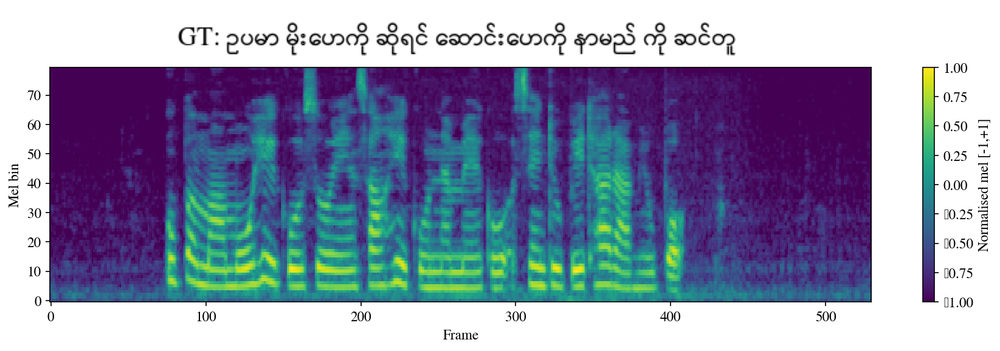

In [54]:
from IPython.display import Image
Image(filename='gt_bur_8266_7413365509.png')

In [55]:
!time python myanmar_tts_transformer.py --stage synth \
--output_dir ./tts_output --gt_sample_id bur_7865_2573585785

/home/ye/.cache/torch/hub/NVIDIA_DeepLearningExamples_torchhub/PyTorch/Classification/ConvNets/image_classification/models/common.py:13: UserWarning: pytorch_quantization module not found, quantization will not be available
  warnings.warn(
/home/ye/.cache/torch/hub/NVIDIA_DeepLearningExamples_torchhub/PyTorch/Classification/ConvNets/image_classification/models/efficientnet.py:17: UserWarning: pytorch_quantization module not found, quantization will not be available
  warnings.warn(
2026-06-20 19:29:27  [WARNING ]  WaveGlow unavailable (RuntimeError), using Griffin-Lim.
2026-06-20 19:29:27  [INFO    ]  Found bur_7865_2573585785 in train
2026-06-20 19:29:27  [INFO    ]  GT text: ဒါပေမဲ့ ဒီ ကျောက် က ရာသက်ပန် မကုန်အောင် ထွက်နေမှာ မဟုတ်ဘူး
2026-06-20 19:29:27  [INFO    ]  GT mel: min=-80.0 max=0.0 mean=-66.1 dB  shape=(596, 80)
/mnt/disk1/ye/exp/asr_tts_SLR80/myanmar_tts_transformer.py:812: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from font(s) Myanmar3.
  plt.tight_layout(); plt.sa

In [59]:
import IPython.display as ipd

# For a local file
ipd.Audio('./gt_bur_7865_2573585785.wav')

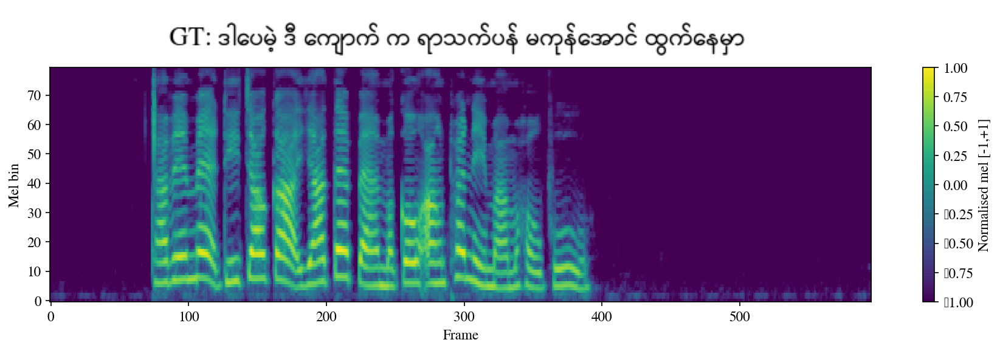

In [61]:
from IPython.display import Image
Image(filename='gt_bur_7865_2573585785.png')

In [62]:
!time python myanmar_tts_transformer.py --stage synth \
--output_dir ./tts_output --gt_sample_id bur_5189_3215659791

/home/ye/.cache/torch/hub/NVIDIA_DeepLearningExamples_torchhub/PyTorch/Classification/ConvNets/image_classification/models/common.py:13: UserWarning: pytorch_quantization module not found, quantization will not be available
  warnings.warn(
/home/ye/.cache/torch/hub/NVIDIA_DeepLearningExamples_torchhub/PyTorch/Classification/ConvNets/image_classification/models/efficientnet.py:17: UserWarning: pytorch_quantization module not found, quantization will not be available
  warnings.warn(
2026-06-20 19:33:03  [WARNING ]  WaveGlow unavailable (RuntimeError), using Griffin-Lim.
2026-06-20 19:33:03  [INFO    ]  Found bur_5189_3215659791 in train
2026-06-20 19:33:03  [INFO    ]  GT text: ကိုကျော်သူ မမေသန်းနု ဒေါ်အေးအေးသင်းတို့ ပါတယ်
2026-06-20 19:33:03  [INFO    ]  GT mel: min=-80.0 max=0.0 mean=-67.1 dB  shape=(456, 80)
/mnt/disk1/ye/exp/asr_tts_SLR80/myanmar_tts_transformer.py:812: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from font(s) Myanmar3.
  plt.tight_layout(); plt.savefig(save_pa

In [63]:
import IPython.display as ipd

# For a local file
ipd.Audio('./gt_bur_5189_3215659791.wav')

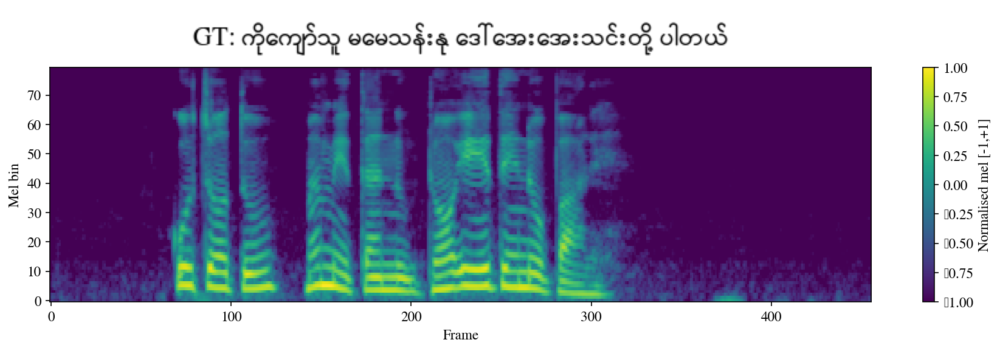

In [64]:
from IPython.display import Image
Image(filename='gt_bur_5189_3215659791.png')

In [65]:
!time python myanmar_tts_transformer.py --stage synth \
--output_dir ./tts_output --gt_sample_id bur_0644_5980380162

/home/ye/.cache/torch/hub/NVIDIA_DeepLearningExamples_torchhub/PyTorch/Classification/ConvNets/image_classification/models/common.py:13: UserWarning: pytorch_quantization module not found, quantization will not be available
  warnings.warn(
/home/ye/.cache/torch/hub/NVIDIA_DeepLearningExamples_torchhub/PyTorch/Classification/ConvNets/image_classification/models/efficientnet.py:17: UserWarning: pytorch_quantization module not found, quantization will not be available
  warnings.warn(
2026-06-20 19:34:31  [WARNING ]  WaveGlow unavailable (RuntimeError), using Griffin-Lim.
2026-06-20 19:34:31  [INFO    ]  Found bur_0644_5980380162 in train
2026-06-20 19:34:31  [INFO    ]  GT text: အမှန်တော့ မှတ်တမ်း ကို ဖလင် နဲ့ ရိုက် ပြီး ပြတဲ့ ရုပ်ရှင် ပါ
2026-06-20 19:34:31  [INFO    ]  GT mel: min=-80.0 max=0.0 mean=-58.1 dB  shape=(434, 80)
/mnt/disk1/ye/exp/asr_tts_SLR80/myanmar_tts_transformer.py:812: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from font(s) Myanmar3.
  plt.tight_layout(); plt.

In [66]:
import IPython.display as ipd

# For a local file
ipd.Audio('./gt_bur_0644_5980380162.wav')

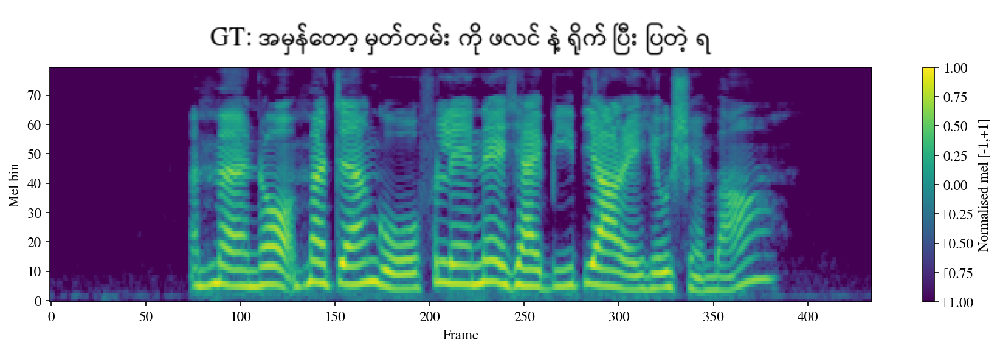

In [67]:
from IPython.display import Image
Image(filename='gt_bur_0644_5980380162.png')

In [68]:
!time python myanmar_tts_transformer.py --stage synth \
--output_dir ./tts_output --gt_sample_id bur_5932_9903725735

/home/ye/.cache/torch/hub/NVIDIA_DeepLearningExamples_torchhub/PyTorch/Classification/ConvNets/image_classification/models/common.py:13: UserWarning: pytorch_quantization module not found, quantization will not be available
  warnings.warn(
/home/ye/.cache/torch/hub/NVIDIA_DeepLearningExamples_torchhub/PyTorch/Classification/ConvNets/image_classification/models/efficientnet.py:17: UserWarning: pytorch_quantization module not found, quantization will not be available
  warnings.warn(
2026-06-20 19:36:09  [WARNING ]  WaveGlow unavailable (RuntimeError), using Griffin-Lim.
2026-06-20 19:36:09  [INFO    ]  Found bur_5932_9903725735 in train
2026-06-20 19:36:09  [INFO    ]  GT text: ကျနော် က ကျော်ထွဋ်ဆွေတို့ ဂျောက်ဂျက်တို့ နဲ့တော့ သီချင်းတွေ ဆိုခဲ့တာ အောင်မြင်တယ်
2026-06-20 19:36:09  [INFO    ]  GT mel: min=-80.0 max=0.0 mean=-54.5 dB  shape=(419, 80)
/mnt/disk1/ye/exp/asr_tts_SLR80/myanmar_tts_transformer.py:812: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from font(s) Myanmar3.
  plt

In [69]:
import IPython.display as ipd

# For a local file
ipd.Audio('./gt_bur_5932_9903725735.wav')

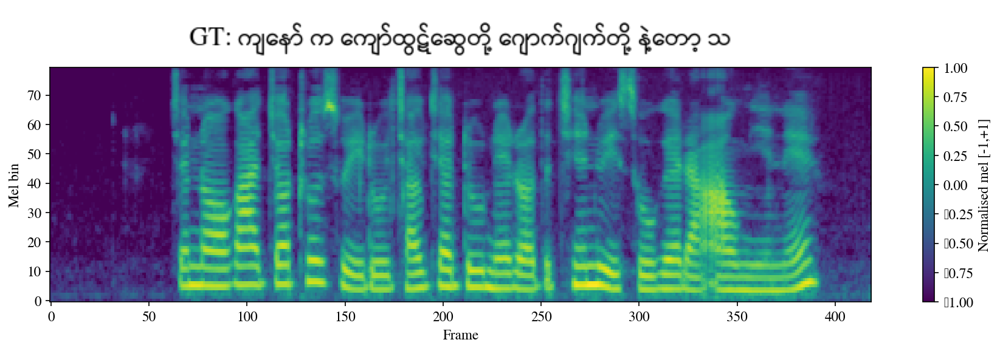

In [70]:
from IPython.display import Image
Image(filename='gt_bur_5932_9903725735.png')

In [71]:
!time python myanmar_tts_transformer.py --stage synth \
--output_dir ./tts_output --gt_sample_id bur_5932_6467856225

/home/ye/.cache/torch/hub/NVIDIA_DeepLearningExamples_torchhub/PyTorch/Classification/ConvNets/image_classification/models/common.py:13: UserWarning: pytorch_quantization module not found, quantization will not be available
  warnings.warn(
/home/ye/.cache/torch/hub/NVIDIA_DeepLearningExamples_torchhub/PyTorch/Classification/ConvNets/image_classification/models/efficientnet.py:17: UserWarning: pytorch_quantization module not found, quantization will not be available
  warnings.warn(
2026-06-20 19:37:43  [WARNING ]  WaveGlow unavailable (RuntimeError), using Griffin-Lim.
2026-06-20 19:37:43  [INFO    ]  Found bur_5932_6467856225 in train
2026-06-20 19:37:43  [INFO    ]  GT text: ရုပ်ရှင်ကားကြီးတွေ ရိုက်ရင် ဖလင် က တအား ကုန်တယ်
2026-06-20 19:37:43  [INFO    ]  GT mel: min=-80.0 max=0.0 mean=-52.6 dB  shape=(317, 80)
/mnt/disk1/ye/exp/asr_tts_SLR80/myanmar_tts_transformer.py:812: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from font(s) Myanmar3.
  plt.tight_layout(); plt.savefig(save_

In [72]:
import IPython.display as ipd

# For a local file
ipd.Audio('./gt_bur_5932_6467856225.wav')

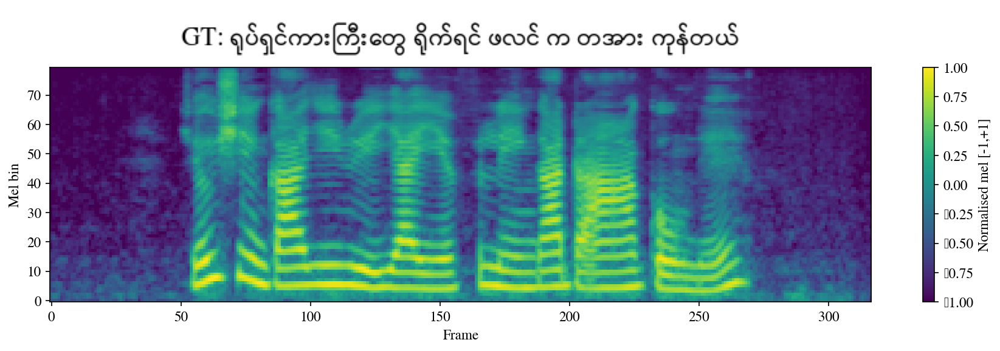

In [73]:
from IPython.display import Image
Image(filename='gt_bur_5932_6467856225.png')

In [74]:
!time python myanmar_tts_transformer.py --stage synth \
--output_dir ./tts_output --gt_sample_id bur_7543_1589569333

/home/ye/.cache/torch/hub/NVIDIA_DeepLearningExamples_torchhub/PyTorch/Classification/ConvNets/image_classification/models/common.py:13: UserWarning: pytorch_quantization module not found, quantization will not be available
  warnings.warn(
/home/ye/.cache/torch/hub/NVIDIA_DeepLearningExamples_torchhub/PyTorch/Classification/ConvNets/image_classification/models/efficientnet.py:17: UserWarning: pytorch_quantization module not found, quantization will not be available
  warnings.warn(
2026-06-20 19:38:58  [WARNING ]  WaveGlow unavailable (RuntimeError), using Griffin-Lim.
2026-06-20 19:38:58  [INFO    ]  Found bur_7543_1589569333 in train
2026-06-20 19:38:58  [INFO    ]  GT text: ကာတွန်း ရှိန်အောင် ကို ပုသိမ်မြို့ မှာ အဖ ဦးမောင်ကွန့် နဲ့ အမိ ဒေါ်သန်းရင်တို့ က မွေးဖွားတယ်
2026-06-20 19:38:58  [INFO    ]  GT mel: min=-80.0 max=0.0 mean=-59.3 dB  shape=(522, 80)
/mnt/disk1/ye/exp/asr_tts_SLR80/myanmar_tts_transformer.py:812: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from font(s) Myan

In [75]:
import IPython.display as ipd

# For a local file
ipd.Audio('./gt_bur_7543_1589569333.wav')

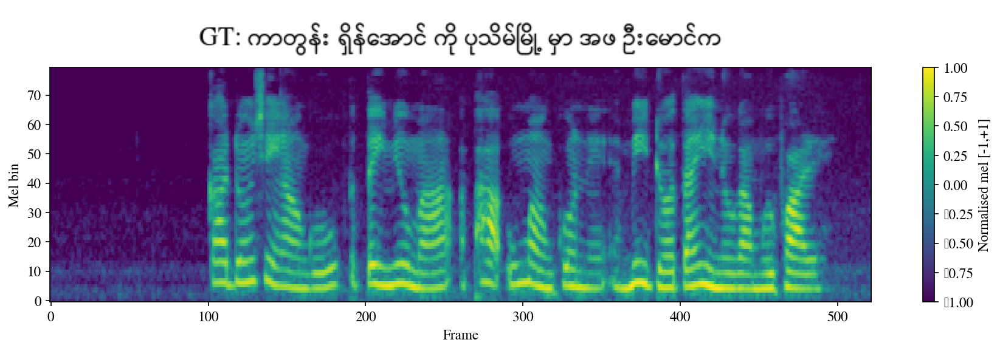

In [76]:
from IPython.display import Image
Image(filename='gt_bur_7543_1589569333.png')

In [77]:
!time python myanmar_tts_transformer.py --stage synth \
--output_dir ./tts_output --gt_sample_id bur_9762_6350280557

/home/ye/.cache/torch/hub/NVIDIA_DeepLearningExamples_torchhub/PyTorch/Classification/ConvNets/image_classification/models/common.py:13: UserWarning: pytorch_quantization module not found, quantization will not be available
  warnings.warn(
/home/ye/.cache/torch/hub/NVIDIA_DeepLearningExamples_torchhub/PyTorch/Classification/ConvNets/image_classification/models/efficientnet.py:17: UserWarning: pytorch_quantization module not found, quantization will not be available
  warnings.warn(
2026-06-20 19:40:18  [WARNING ]  WaveGlow unavailable (RuntimeError), using Griffin-Lim.
2026-06-20 19:40:18  [INFO    ]  Found bur_9762_6350280557 in train
2026-06-20 19:40:18  [INFO    ]  GT text: ကြည့်ချင်တယ် ဆိုရင်လည်း ခရီးစဉ် တခါတည်း ထည့် ဆွဲထားနော
2026-06-20 19:40:18  [INFO    ]  GT mel: min=-80.0 max=0.0 mean=-60.4 dB  shape=(434, 80)
/mnt/disk1/ye/exp/asr_tts_SLR80/myanmar_tts_transformer.py:812: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from font(s) Myanmar3.
  plt.tight_layout(); plt.savefi

In [78]:
import IPython.display as ipd

# For a local file
ipd.Audio('./gt_bur_9762_6350280557.wav')

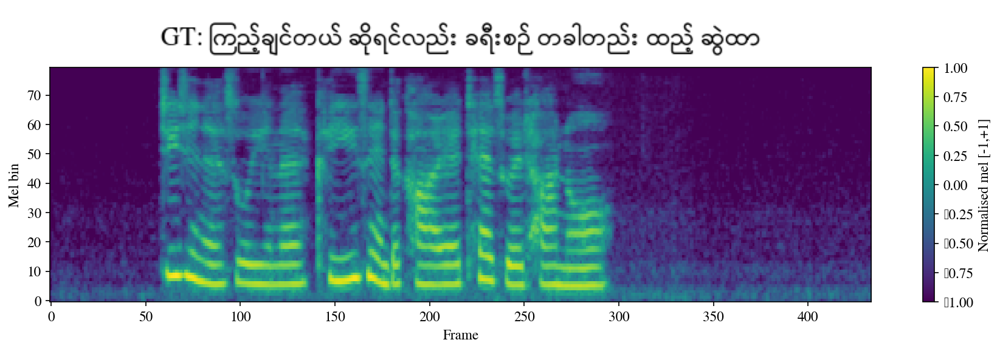

In [79]:
from IPython.display import Image
Image(filename='gt_bur_9762_6350280557.png')

In [80]:
!time python myanmar_tts_transformer.py --stage synth \
--output_dir ./tts_output --gt_sample_id bur_5903_4827254748

/home/ye/.cache/torch/hub/NVIDIA_DeepLearningExamples_torchhub/PyTorch/Classification/ConvNets/image_classification/models/common.py:13: UserWarning: pytorch_quantization module not found, quantization will not be available
  warnings.warn(
/home/ye/.cache/torch/hub/NVIDIA_DeepLearningExamples_torchhub/PyTorch/Classification/ConvNets/image_classification/models/efficientnet.py:17: UserWarning: pytorch_quantization module not found, quantization will not be available
  warnings.warn(
2026-06-20 19:41:50  [WARNING ]  WaveGlow unavailable (RuntimeError), using Griffin-Lim.
2026-06-20 19:41:50  [INFO    ]  Found bur_5903_4827254748 in train
2026-06-20 19:41:50  [INFO    ]  GT text: အခု က ဖုန်း တစ်လုံး ပဲ ထားရတော့တယ် ဟု ဆိုသည်
2026-06-20 19:41:50  [INFO    ]  GT mel: min=-80.0 max=0.0 mean=-54.1 dB  shape=(295, 80)
/mnt/disk1/ye/exp/asr_tts_SLR80/myanmar_tts_transformer.py:812: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from font(s) Myanmar3.
  plt.tight_layout(); plt.savefig(save_pat

In [81]:
import IPython.display as ipd

# For a local file
ipd.Audio('./gt_bur_5903_4827254748.wav')

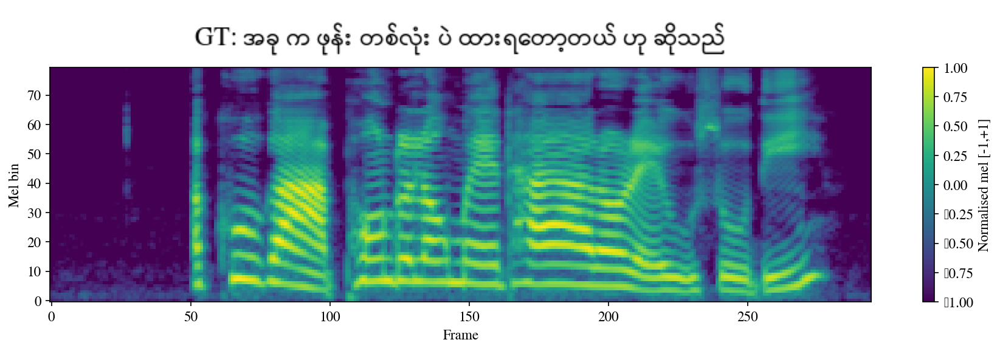

In [85]:
from IPython.display import Image
Image(filename='./gt_bur_5903_4827254748.png')

In [86]:
!time python myanmar_tts_transformer.py --stage synth \
--output_dir ./tts_output --gt_sample_id bur_3260_5647990176

/home/ye/.cache/torch/hub/NVIDIA_DeepLearningExamples_torchhub/PyTorch/Classification/ConvNets/image_classification/models/common.py:13: UserWarning: pytorch_quantization module not found, quantization will not be available
  warnings.warn(
/home/ye/.cache/torch/hub/NVIDIA_DeepLearningExamples_torchhub/PyTorch/Classification/ConvNets/image_classification/models/efficientnet.py:17: UserWarning: pytorch_quantization module not found, quantization will not be available
  warnings.warn(
2026-06-20 19:43:40  [WARNING ]  WaveGlow unavailable (RuntimeError), using Griffin-Lim.
2026-06-20 19:43:40  [INFO    ]  Found bur_3260_5647990176 in train
2026-06-20 19:43:40  [INFO    ]  GT text: ကိုယ် ကလည်း အချိန် မပေးနိုင်ဘူး ဆိုတော့ ဆရာဝန်ကြီးတွေ နဲ့ တိုင်ပင်ရတယ်
2026-06-20 19:43:40  [INFO    ]  GT mel: min=-80.0 max=0.0 mean=-54.5 dB  shape=(390, 80)
/mnt/disk1/ye/exp/asr_tts_SLR80/myanmar_tts_transformer.py:812: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from font(s) Myanmar3.
  plt.tight_layo

In [87]:
import IPython.display as ipd

# For a local file
ipd.Audio('./gt_bur_3260_5647990176.wav')

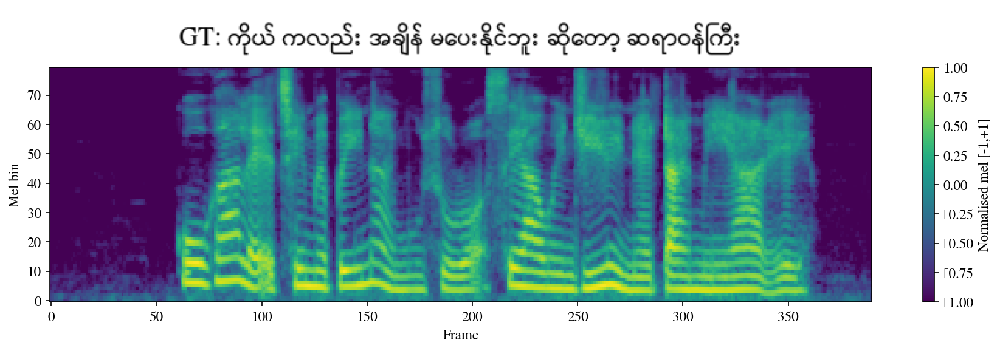

In [88]:
from IPython.display import Image
Image(filename='gt_bur_3260_5647990176.png')

In [89]:
!time python myanmar_tts_transformer.py --stage synth \
--output_dir ./tts_output --gt_sample_id bur_5362_4730425798

/home/ye/.cache/torch/hub/NVIDIA_DeepLearningExamples_torchhub/PyTorch/Classification/ConvNets/image_classification/models/common.py:13: UserWarning: pytorch_quantization module not found, quantization will not be available
  warnings.warn(
/home/ye/.cache/torch/hub/NVIDIA_DeepLearningExamples_torchhub/PyTorch/Classification/ConvNets/image_classification/models/efficientnet.py:17: UserWarning: pytorch_quantization module not found, quantization will not be available
  warnings.warn(
2026-06-20 19:45:12  [WARNING ]  WaveGlow unavailable (RuntimeError), using Griffin-Lim.
2026-06-20 19:45:12  [INFO    ]  Found bur_5362_4730425798 in train
2026-06-20 19:45:12  [INFO    ]  GT text: ခေတ်မှီချင်သူတွေ ကတော့ ရေခဲမုန့် ကျွေးကြတာပေါ့
2026-06-20 19:45:12  [INFO    ]  GT mel: min=-80.0 max=0.0 mean=-61.8 dB  shape=(456, 80)
/mnt/disk1/ye/exp/asr_tts_SLR80/myanmar_tts_transformer.py:812: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from font(s) Myanmar3.
  plt.tight_layout(); plt.savefig(save_p

In [90]:
import IPython.display as ipd

# For a local file
ipd.Audio('./gt_bur_5362_4730425798.wav')

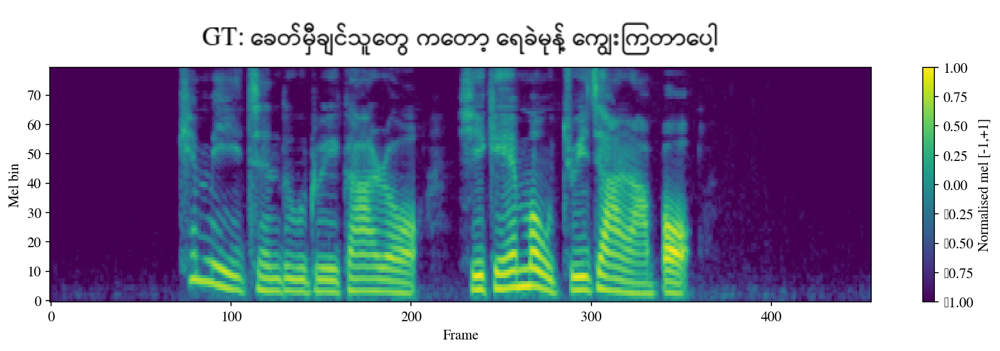

In [91]:
from IPython.display import Image
Image(filename='gt_bur_5362_4730425798.png')

In [92]:
!time python myanmar_tts_transformer.py --stage synth \
--output_dir ./tts_output --gt_sample_id bur_8266_3739445651

/home/ye/.cache/torch/hub/NVIDIA_DeepLearningExamples_torchhub/PyTorch/Classification/ConvNets/image_classification/models/common.py:13: UserWarning: pytorch_quantization module not found, quantization will not be available
  warnings.warn(
/home/ye/.cache/torch/hub/NVIDIA_DeepLearningExamples_torchhub/PyTorch/Classification/ConvNets/image_classification/models/efficientnet.py:17: UserWarning: pytorch_quantization module not found, quantization will not be available
  warnings.warn(
2026-06-20 19:46:56  [WARNING ]  WaveGlow unavailable (RuntimeError), using Griffin-Lim.
2026-06-20 19:46:56  [INFO    ]  Found bur_8266_3739445651 in train
2026-06-20 19:46:56  [INFO    ]  GT text: ကဲ အခု တော့ ဘယ့်နှယ့် ရှိစ
2026-06-20 19:46:56  [INFO    ]  GT mel: min=-80.0 max=0.0 mean=-65.5 dB  shape=(361, 80)
/mnt/disk1/ye/exp/asr_tts_SLR80/myanmar_tts_transformer.py:812: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from font(s) Myanmar3.
  plt.tight_layout(); plt.savefig(save_path,dpi=150,bbox_inc

In [93]:
import IPython.display as ipd

# For a local file
ipd.Audio('./gt_bur_8266_3739445651.wav')

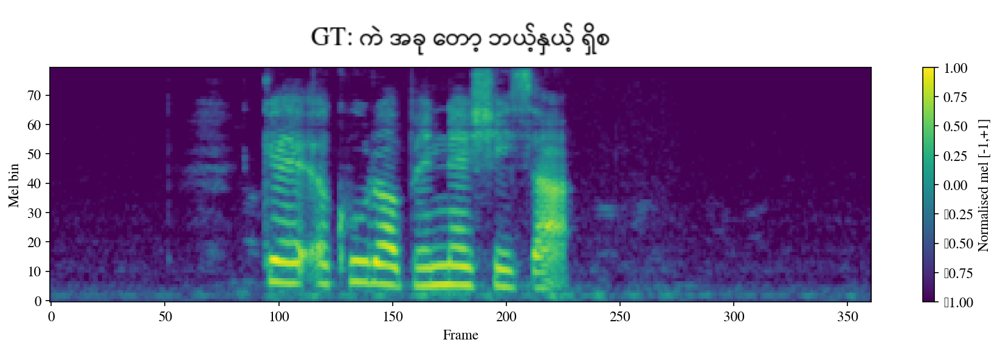

In [94]:
from IPython.display import Image
Image(filename='gt_bur_8266_3739445651.png')

In [95]:
!time python myanmar_tts_transformer.py --stage synth \
--output_dir ./tts_output --gt_sample_id bur_9135_9365873650

/home/ye/.cache/torch/hub/NVIDIA_DeepLearningExamples_torchhub/PyTorch/Classification/ConvNets/image_classification/models/common.py:13: UserWarning: pytorch_quantization module not found, quantization will not be available
  warnings.warn(
/home/ye/.cache/torch/hub/NVIDIA_DeepLearningExamples_torchhub/PyTorch/Classification/ConvNets/image_classification/models/efficientnet.py:17: UserWarning: pytorch_quantization module not found, quantization will not be available
  warnings.warn(
2026-06-20 19:48:09  [WARNING ]  WaveGlow unavailable (RuntimeError), using Griffin-Lim.
2026-06-20 19:48:09  [INFO    ]  Found bur_9135_9365873650 in train
2026-06-20 19:48:09  [INFO    ]  GT text: အထက် မြန်မာပြည် မန္တလေး မြို့ ၌လည်း ဘတ်စကတ်ဘော ကလပ်အသင်းများ ရှိသည်
2026-06-20 19:48:09  [INFO    ]  GT mel: min=-80.0 max=0.0 mean=-62.8 dB  shape=(368, 80)
/mnt/disk1/ye/exp/asr_tts_SLR80/myanmar_tts_transformer.py:812: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from font(s) Myanmar3.
  plt.tight_layout(

In [96]:
import IPython.display as ipd

# For a local file
ipd.Audio('./gt_bur_9135_9365873650.wav')

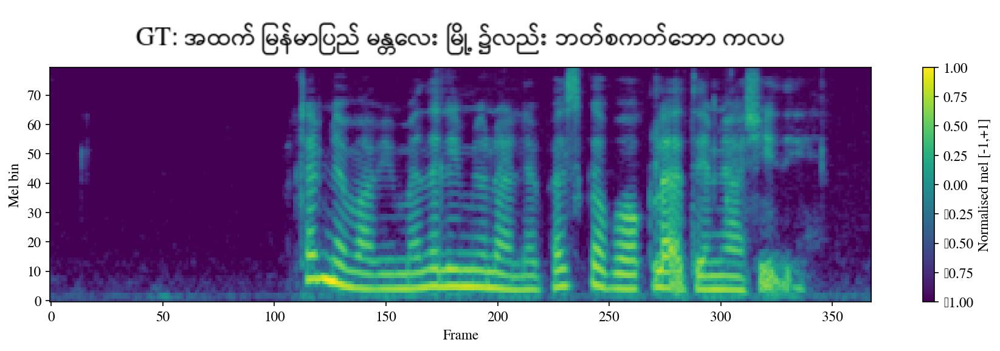

In [97]:
from IPython.display import Image
Image(filename='gt_bur_9135_9365873650.png')

In [98]:
!time python myanmar_tts_transformer.py --stage synth \
--output_dir ./tts_output --gt_sample_id bur_5932_0137380639

/home/ye/.cache/torch/hub/NVIDIA_DeepLearningExamples_torchhub/PyTorch/Classification/ConvNets/image_classification/models/common.py:13: UserWarning: pytorch_quantization module not found, quantization will not be available
  warnings.warn(
/home/ye/.cache/torch/hub/NVIDIA_DeepLearningExamples_torchhub/PyTorch/Classification/ConvNets/image_classification/models/efficientnet.py:17: UserWarning: pytorch_quantization module not found, quantization will not be available
  warnings.warn(
2026-06-20 19:49:43  [WARNING ]  WaveGlow unavailable (RuntimeError), using Griffin-Lim.
2026-06-20 19:49:43  [INFO    ]  Found bur_5932_0137380639 in train
2026-06-20 19:49:43  [INFO    ]  GT text: အရင် တုန်းကတော့ ဒီ ကိစ္စ ကို အားလုံး လေးငါးခြောက်ယောက်လောက် နဲ့ လုပ်တာ
2026-06-20 19:49:43  [INFO    ]  GT mel: min=-80.0 max=0.0 mean=-54.2 dB  shape=(339, 80)
/mnt/disk1/ye/exp/asr_tts_SLR80/myanmar_tts_transformer.py:812: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from font(s) Myanmar3.
  plt.tight_layo

In [99]:
import IPython.display as ipd

# For a local file
ipd.Audio('./gt_bur_5932_0137380639.wav')

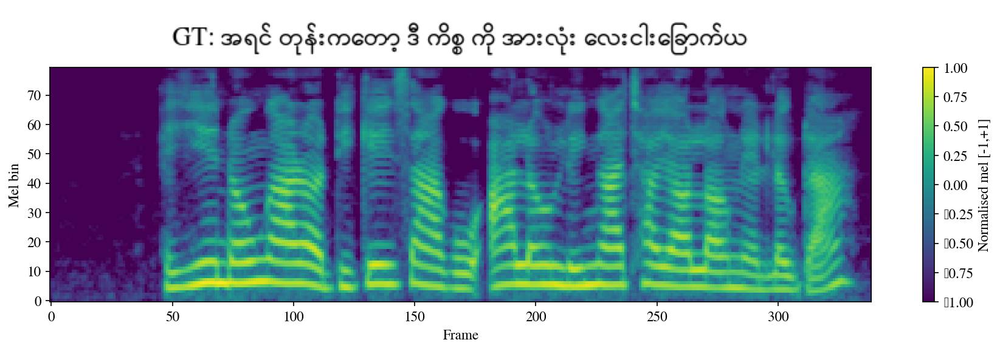

In [100]:
from IPython.display import Image
Image(filename='gt_bur_5932_0137380639.png')

In [101]:
!time python myanmar_tts_transformer.py --stage synth \
--output_dir ./tts_output --gt_sample_id bur_8698_8976831996

/home/ye/.cache/torch/hub/NVIDIA_DeepLearningExamples_torchhub/PyTorch/Classification/ConvNets/image_classification/models/common.py:13: UserWarning: pytorch_quantization module not found, quantization will not be available
  warnings.warn(
/home/ye/.cache/torch/hub/NVIDIA_DeepLearningExamples_torchhub/PyTorch/Classification/ConvNets/image_classification/models/efficientnet.py:17: UserWarning: pytorch_quantization module not found, quantization will not be available
  warnings.warn(
2026-06-20 19:50:50  [WARNING ]  WaveGlow unavailable (RuntimeError), using Griffin-Lim.
2026-06-20 19:50:50  [INFO    ]  Found bur_8698_8976831996 in train
2026-06-20 19:50:50  [INFO    ]  GT text: မင်း အမေ ကို ကောင်းကောင်း ဆော်သွား လို့ မင်း ထွက်လာတာ မမေ့နဲ့
2026-06-20 19:50:50  [INFO    ]  GT mel: min=-80.0 max=0.0 mean=-63.6 dB  shape=(464, 80)
/mnt/disk1/ye/exp/asr_tts_SLR80/myanmar_tts_transformer.py:812: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from font(s) Myanmar3.
  plt.tight_layout(); plt

In [102]:
import IPython.display as ipd

# For a local file
ipd.Audio('./gt_bur_8698_8976831996.wav')

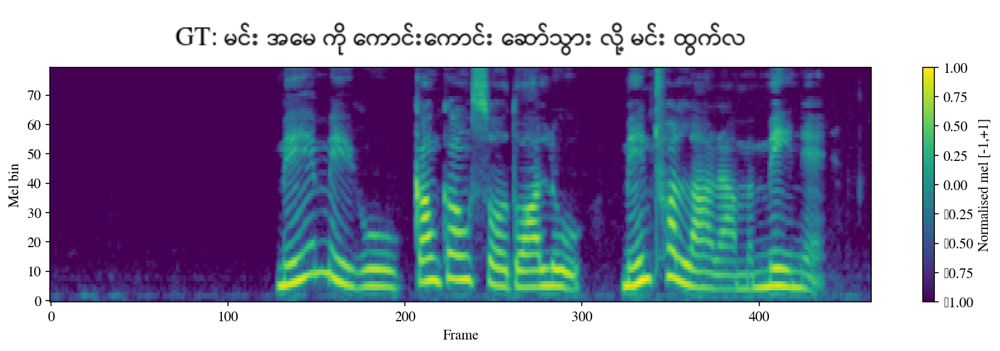

In [103]:
from IPython.display import Image
Image(filename='gt_bur_8698_8976831996.png')

In [104]:
!time python myanmar_tts_transformer.py --stage synth \
--output_dir ./tts_output --gt_sample_id bur_0366_2701213104

/home/ye/.cache/torch/hub/NVIDIA_DeepLearningExamples_torchhub/PyTorch/Classification/ConvNets/image_classification/models/common.py:13: UserWarning: pytorch_quantization module not found, quantization will not be available
  warnings.warn(
/home/ye/.cache/torch/hub/NVIDIA_DeepLearningExamples_torchhub/PyTorch/Classification/ConvNets/image_classification/models/efficientnet.py:17: UserWarning: pytorch_quantization module not found, quantization will not be available
  warnings.warn(
2026-06-20 19:52:12  [WARNING ]  WaveGlow unavailable (RuntimeError), using Griffin-Lim.
2026-06-20 19:52:12  [INFO    ]  Found bur_0366_2701213104 in train
2026-06-20 19:52:12  [INFO    ]  GT text: ကမ္ဘာအနှံ့ မှ သတင်း အချက်အလက်တွေ ကို သိနိုင်သည်
2026-06-20 19:52:12  [INFO    ]  GT mel: min=-80.0 max=0.0 mean=-57.2 dB  shape=(302, 80)
/mnt/disk1/ye/exp/asr_tts_SLR80/myanmar_tts_transformer.py:812: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from font(s) Myanmar3.
  plt.tight_layout(); plt.savefig(save_

In [105]:
import IPython.display as ipd

# For a local file
ipd.Audio('./gt_bur_0366_2701213104.wav')

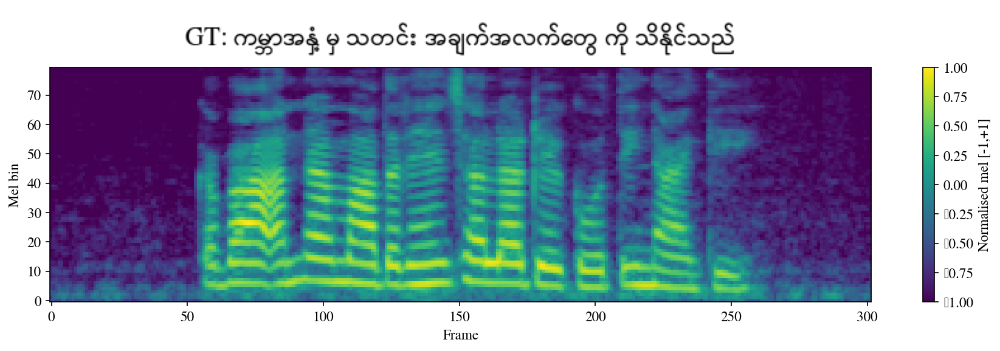

In [106]:
from IPython.display import Image
Image(filename='gt_bur_0366_2701213104.png')

In [107]:
!time python myanmar_tts_transformer.py --stage synth \
--output_dir ./tts_output --gt_sample_id bur_0644_2661360424

/home/ye/.cache/torch/hub/NVIDIA_DeepLearningExamples_torchhub/PyTorch/Classification/ConvNets/image_classification/models/common.py:13: UserWarning: pytorch_quantization module not found, quantization will not be available
  warnings.warn(
/home/ye/.cache/torch/hub/NVIDIA_DeepLearningExamples_torchhub/PyTorch/Classification/ConvNets/image_classification/models/efficientnet.py:17: UserWarning: pytorch_quantization module not found, quantization will not be available
  warnings.warn(
2026-06-20 19:53:21  [WARNING ]  WaveGlow unavailable (RuntimeError), using Griffin-Lim.
2026-06-20 19:53:21  [INFO    ]  Found bur_0644_2661360424 in train
2026-06-20 19:53:21  [INFO    ]  GT text: ဆိုနီ ကရော ဘယ်လိုတွေ ချပြမလဲ လေ့လာကြည့်ရအောင်
2026-06-20 19:53:21  [INFO    ]  GT mel: min=-80.0 max=0.0 mean=-54.5 dB  shape=(368, 80)
/mnt/disk1/ye/exp/asr_tts_SLR80/myanmar_tts_transformer.py:812: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from font(s) Myanmar3.
  plt.tight_layout(); plt.savefig(save_pa

In [108]:
import IPython.display as ipd

# For a local file
ipd.Audio('./gt_bur_0644_2661360424.wav')

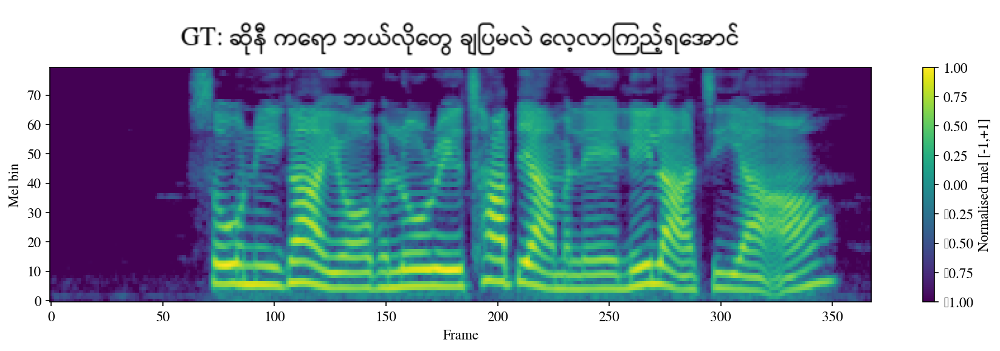

In [109]:
from IPython.display import Image
Image(filename='gt_bur_0644_2661360424.png')

In [110]:
!time python myanmar_tts_transformer.py --stage synth \
--output_dir ./tts_output --gt_sample_id bur_7712_5029179191

/home/ye/.cache/torch/hub/NVIDIA_DeepLearningExamples_torchhub/PyTorch/Classification/ConvNets/image_classification/models/common.py:13: UserWarning: pytorch_quantization module not found, quantization will not be available
  warnings.warn(
/home/ye/.cache/torch/hub/NVIDIA_DeepLearningExamples_torchhub/PyTorch/Classification/ConvNets/image_classification/models/efficientnet.py:17: UserWarning: pytorch_quantization module not found, quantization will not be available
  warnings.warn(
2026-06-20 19:54:49  [WARNING ]  WaveGlow unavailable (RuntimeError), using Griffin-Lim.
2026-06-20 19:54:49  [INFO    ]  Found bur_7712_5029179191 in train
2026-06-20 19:54:49  [INFO    ]  GT text: ကမ္မောဇ ဘောလုံး အသင်း က ဥက္ကဌ ဦးခင်မောင်လတ် က အရင်ဆုံး သုံးနှစ် ငှားရမ်းပါတယ်
2026-06-20 19:54:49  [INFO    ]  GT mel: min=-80.0 max=0.0 mean=-54.9 dB  shape=(655, 80)
/mnt/disk1/ye/exp/asr_tts_SLR80/myanmar_tts_transformer.py:812: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from font(s) Myanmar3.
  plt.tig

In [111]:
import IPython.display as ipd

# For a local file
ipd.Audio('./gt_bur_7712_5029179191.wav')

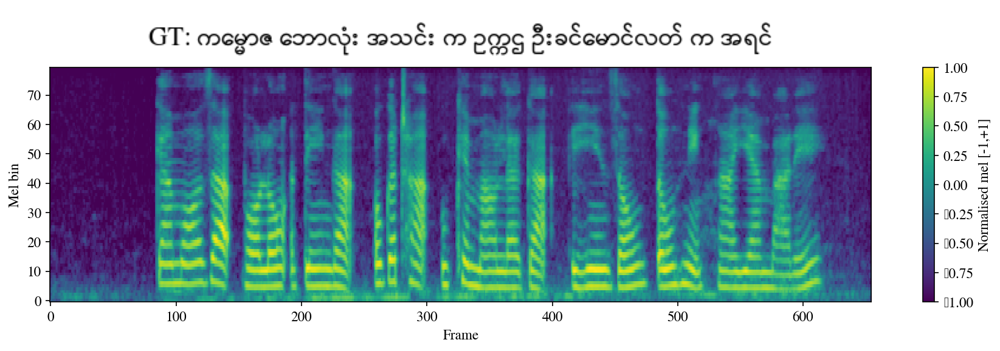

In [112]:
from IPython.display import Image
Image(filename='gt_bur_7712_5029179191.png')

In [113]:
!time python myanmar_tts_transformer.py --stage synth \
--output_dir ./tts_output --gt_sample_id bur_5362_4875790905

/home/ye/.cache/torch/hub/NVIDIA_DeepLearningExamples_torchhub/PyTorch/Classification/ConvNets/image_classification/models/common.py:13: UserWarning: pytorch_quantization module not found, quantization will not be available
  warnings.warn(
/home/ye/.cache/torch/hub/NVIDIA_DeepLearningExamples_torchhub/PyTorch/Classification/ConvNets/image_classification/models/efficientnet.py:17: UserWarning: pytorch_quantization module not found, quantization will not be available
  warnings.warn(
2026-06-20 19:56:04  [WARNING ]  WaveGlow unavailable (RuntimeError), using Griffin-Lim.
2026-06-20 19:56:04  [INFO    ]  Found bur_5362_4875790905 in train
2026-06-20 19:56:04  [INFO    ]  GT text: ကျွန်တော် ကလည်း ဒိတ်ဒိတ်ကျဲ အောင်မြင်နေတဲ့ မင်းသား မှ မဟုတ်တာလေ
2026-06-20 19:56:04  [INFO    ]  GT mel: min=-80.0 max=0.0 mean=-57.5 dB  shape=(522, 80)
/mnt/disk1/ye/exp/asr_tts_SLR80/myanmar_tts_transformer.py:812: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from font(s) Myanmar3.
  plt.tight_layout(); p

In [114]:
import IPython.display as ipd

# For a local file
ipd.Audio('./gt_bur_5362_4875790905.wav')

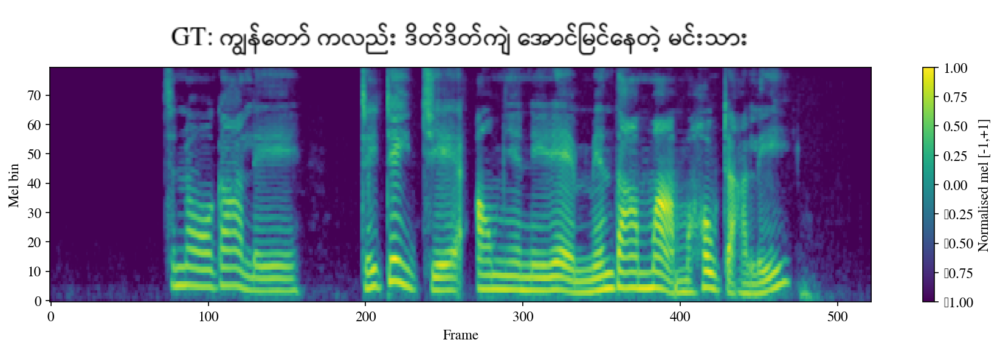

In [115]:
from IPython.display import Image
Image(filename='gt_bur_5362_4875790905.png')

In [116]:
!time python myanmar_tts_transformer.py --stage synth \
--output_dir ./tts_output --gt_sample_id bur_3260_2712519099

/home/ye/.cache/torch/hub/NVIDIA_DeepLearningExamples_torchhub/PyTorch/Classification/ConvNets/image_classification/models/common.py:13: UserWarning: pytorch_quantization module not found, quantization will not be available
  warnings.warn(
/home/ye/.cache/torch/hub/NVIDIA_DeepLearningExamples_torchhub/PyTorch/Classification/ConvNets/image_classification/models/efficientnet.py:17: UserWarning: pytorch_quantization module not found, quantization will not be available
  warnings.warn(
2026-06-20 19:57:36  [WARNING ]  WaveGlow unavailable (RuntimeError), using Griffin-Lim.
2026-06-20 19:57:36  [INFO    ]  Found bur_3260_2712519099 in train
2026-06-20 19:57:36  [INFO    ]  GT text: ကျနော် က ရိက္ခာ ယူခိုင်း တုန်း ထွက်ပြေးလာတာပါ
2026-06-20 19:57:36  [INFO    ]  GT mel: min=-80.0 max=0.0 mean=-56.9 dB  shape=(309, 80)
/mnt/disk1/ye/exp/asr_tts_SLR80/myanmar_tts_transformer.py:812: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from font(s) Myanmar3.
  plt.tight_layout(); plt.savefig(save_pa

In [117]:
import IPython.display as ipd

# For a local file
ipd.Audio('./gt_bur_3260_2712519099.wav')

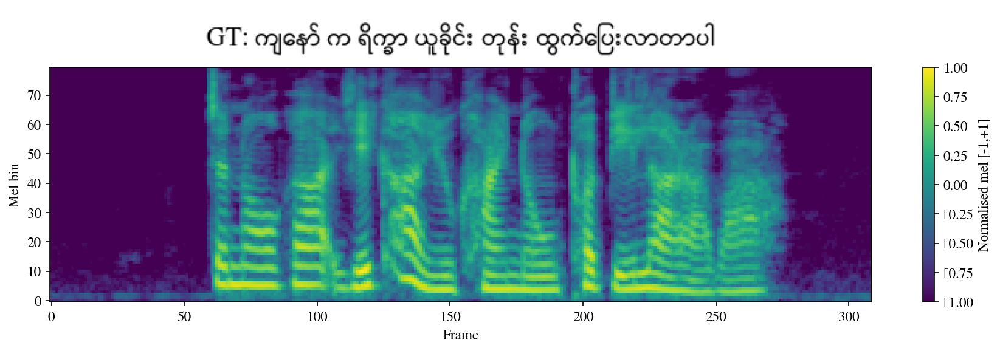

In [118]:
from IPython.display import Image
Image(filename='gt_bur_3260_2712519099.png')

## Summary

- ဒီ TTS Lab (သို့) tutorial အတွက်က Autoregressive Transformer + Guided Attention Loss ကို သုံးခဲ့တယ်။
- ဒီ architecture နဲ့က training loss ကို 0.2408 ထိချနိုင်ခဲ့တာကို တွေ့ရပါလိမ့်မယ်။
- GT resynthesis ကို ကောင်းကောင်းလေး လုပ်ပေးနိုင်ပါတယ်။
- ဒါပေမဲ့ လက်ရှိ approach နဲ့ experiment မှာက TTS model prediction က အဆင်မပြေသေးတာကို တွေ့ခဲ့ကြရပါလိမ့်မယ်။
- အိမ်စာ အနေနဲ့ TTS model ရဲ့ mel spectrogram ရလဒ်ကို တက်အောင် လုပ်ကြည့်ကြပါ။ လိုအပ်ရင် decoder ကိုလည်း ပြောင်းကြည့်ပါ။  